<a href="https://colab.research.google.com/github/Manos-Mak120/-/blob/Scrapper--Teasers/BIDEN_ATHENS_VOICE_TEASERS_WORDCLOUD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import requests
from bs4 import BeautifulSoup
import pandas as pd

import time
import random

from tqdm import tqdm

In [ ]:
def get_webpage_soup(url):
  headers = {
        "User-Agent": "Mozilla/5.0"
    }
  response = requests.get(url, headers=headers)
  if response.status_code != 200:
    return None
  else:
    return BeautifulSoup(response.text, 'html.parser')

In [ ]:
def get_article_elements_from_soup(soup,article_url):
    # title
    try:
        title = soup.find("h1").text.strip()
    except:
        title = ""

    # datetime
    try:
        datetime_str = soup.find("time")["datetime"]
        date_str = datetime_str.split("T")[0]
        time_str = datetime_str.split("T")[1].split("+")[0]
    except:
        date_str = ""
        time_str = ""

    # section
    try:
        section_div = soup.find("div", class_="main-category-block") or soup.find("div", class_="main-category")
        section = section_div.text.strip() if section_div else ""
    except:
        section = ""

    # author
    try:
      author_tag = soup.find("a", class_="author-name") or soup.find("span", class_="author-name")
      author = author_tag.text.strip() if author_tag else ""
    except:
        author = ""
    # excerpt
    try:
        excerpt_div = soup.find("div", class_="p.main-intro") or soup.find(itemprop="description") or soup.find("div", class_="nx-excerpt")
        excerpt = excerpt_div.text.strip() if excerpt_div else ""
    except:
        excerpt = ""

    # text body
    try:
      content_div = soup.find("div", class_="main-text story-fulltext")
      elements = content_div.find_all(["p", "h2", "h3", "ul", "ol", "li"]) if content_div else []
      text_body = " ".join(el.get_text(strip=True) for el in elements if el.get_text(strip=True))
    except:
        text_body = ""

    # feature image
    try:
        img_block = soup.find("div", class_="article-image") or soup.find("figure")
        feat_img_link = img_block.find("img")["src"] if img_block and img_block.find("img") else ""
    except:
        feat_img_link = ""

    # image caption
    try:
        caption_div = soup.find("div", class_="image-caption") or soup.find("figcaption")
        image_caption = caption_div.text.strip() if caption_div else ""
    except:
        image_caption = ""

    articleD = {
        "article_url": article_url,
        "title": title,
        "date": date_str,
        "time": time_str,
        "section": section,
        "author": author,
        "excerpt": excerpt,
        "text_body": text_body,
        "feat_img_link": feat_img_link,
        "feat_img_cation": image_caption
    }

    return articleD

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
athens_voice_df = pd.read_csv("/content/drive/MyDrive/Athens.voice/Scrapper/biden_df_2020_2021.csv")

In [ ]:
biden_21 = athens_voice_df

In [ ]:
biden_21

,title,article_url,date,time,author,excerpt,section
0,Μπάιντεν σε Πούτιν: Θα αντιδράσουμε σε εισβολή...,https://www.athensvoice.gr/epikairotita/diethn...,2021-12-31,05:58:00,Newsroom,Η Ουάσινγκτον θα αντιδράσει «αποφασιστικά» σε ...,Κοσμος
1,Σήμερα η τηλεφωνική επικοινωνία Τζο Μπάιντεν &...,https://www.athensvoice.gr/epikairotita/diethn...,2021-12-30,06:36:06,Newsroom,Ο πρόεδρος των ΗΠΑ Τζο Μπάιντεν και ο Ρώσος ομ...,Κοσμος
2,Πούτιν και Μπάιντεν θα έχουν ξανά επικοινωνία ...,https://www.athensvoice.gr/epikairotita/diethn...,2021-12-29,20:15:00,Newsroom,Ο πρόεδρος των ΗΠΑ Τζο Μπάιντεν και ο Ρώσος ομ...,Κοσμος
3,Τζον Μάντεν: Πέθανε ο θρύλος του NFL,https://www.athensvoice.gr/epikairotita/athlit...,2021-12-29,12:39:00,Newsroom,Τζον Μάντεν: Έφυγε από τη ζωή σε ηλικία 85 ετώ...,Αθλητισμος
4,Πολίτης εξύβρισε τον Μπάιντεν κατά τη διάρκεια...,https://www.athensvoice.gr/epikairotita/diethn...,2021-12-25,07:13:08,Newsroom,ΗΠΑ: Πολίτης εξύβρισε τον Μπάιντεν κατά τη διά...,Κοσμος
...,...,...,...,...,...,...,...
551,Μπάιντεν για Αγία Σοφία: Τι αποκάλυψε ο αρχιεπ...,https://www.athensvoice.gr/epikairotita/diethn...,2020-07-17,15:25:00,Newsroom,Ο Τζο Μπάιντεν τηλεφώνησε στον Αρχιεπίσκοπο Αμ...,Κοσμος
552,Μπάιντεν: Ποιοι υπέγραψαν εξαψήφιες επιταγές γ...,https://www.athensvoice.gr/epikairotita/diethn...,2020-07-16,18:23:00,Newsroom,"Ο Μπάιντεν ξεπέρασε τον Τραμπ, για πρώτη φορά,...",Κοσμος
553,Αγία Σοφία - Μπάιντεν: Καλώ τον Ερντογάν να αν...,https://www.athensvoice.gr/epikairotita/diethn...,2020-07-11,14:19:00,Newsroom,Ο Τζο Μπάιντεν κάλεσε τον Ερντογάν να αναιρέσ...,Κοσμος
554,Σε τι πανεπιστήμιο μπαίνουν σήμερα τα παιδιά,https://www.athensvoice.gr/epikairotita/politi...,2020-07-10,06:48:00,Χρύσα Μακρή,Εισαγωγή στα πανεπιστήμια: Τι αλλάζει από φέτο...,Πολιτικη & Οικονομια


In [ ]:
biden_21.dtypes

,0
title,object
article_url,object
date,object
time,object
author,object
excerpt,object
section,object


In [ ]:
# Convert the 'date' column to datetime objects
# Changed the format string to '%Y-%m-%d' to match the 'YYYY-MM-DD' format
biden_21['date'] = pd.to_datetime(biden_21['date'], format='%Y-%m-%d')
biden_21.dtypes

,0
title,object
article_url,object
date,datetime64[ns]
time,object
author,object
excerpt,object
section,object


In [ ]:
# Convert 'title' and 'excerpt' columns to string type and fill potential NaNs with empty strings
biden_21['title'] = biden_21['title'].astype(str).fillna('')
biden_21['excerpt'] = biden_21['excerpt'].astype(str).fillna('')

# Now apply the aggregation to join the columns
biden_21["text"] = biden_21[['title', 'excerpt']].agg('. '.join, axis=1)  #axis=1 γίνεται σε όλα τα rows axis=0 σε στηλες
biden_21.loc[0, 'text']

'Μπάιντεν σε Πούτιν: Θα αντιδράσουμε σε εισβολή στην Ουκρανία. Η Ουάσινγκτον θα αντιδράσει «αποφασιστικά» σε κάθε ρωσική «περαιτέρω εισβολή» στην Ουκρανία, είπε ο Τζο Μπάιντεν στον Βλαντίμιρ Πούτιν.'

In [ ]:
short_df = biden_21[['date', 'text']]
short_df.head()

,date,text
0,2021-12-31,Μπάιντεν σε Πούτιν: Θα αντιδράσουμε σε εισβολή...
1,2021-12-30,Σήμερα η τηλεφωνική επικοινωνία Τζο Μπάιντεν &...
2,2021-12-29,Πούτιν και Μπάιντεν θα έχουν ξανά επικοινωνία ...
3,2021-12-29,Τζον Μάντεν: Πέθανε ο θρύλος του NFL. Τζον Μάν...
4,2021-12-25,Πολίτης εξύβρισε τον Μπάιντεν κατά τη διάρκεια...


In [ ]:
# Add year, month, and day columns to the biden_21 DataFrame
biden_21['year'] = pd.DatetimeIndex(biden_21['date']).year
biden_21['month'] = pd.DatetimeIndex(biden_21['date']).month
biden_21['day'] = pd.DatetimeIndex(biden_21['date']).day

# Now the filtering will work
trump_nov_jan_teasers = biden_21[
    (biden_21['month'] == 11) |
    (biden_21['month'] == 12) |
    (biden_21['month'] == 1)  |
    (biden_21['month'] == 2) |
    (biden_21["month"] == 3) |
    (biden_21["month"] == 4)
]
trump_nov_jan_teasers

,title,article_url,date,time,author,excerpt,section,text,year,month,day
0,Μπάιντεν σε Πούτιν: Θα αντιδράσουμε σε εισβολή...,https://www.athensvoice.gr/epikairotita/diethn...,2021-12-31,05:58:00,Newsroom,Η Ουάσινγκτον θα αντιδράσει «αποφασιστικά» σε ...,Κοσμος,Μπάιντεν σε Πούτιν: Θα αντιδράσουμε σε εισβολή...,2021,12,31
1,Σήμερα η τηλεφωνική επικοινωνία Τζο Μπάιντεν &...,https://www.athensvoice.gr/epikairotita/diethn...,2021-12-30,06:36:06,Newsroom,Ο πρόεδρος των ΗΠΑ Τζο Μπάιντεν και ο Ρώσος ομ...,Κοσμος,Σήμερα η τηλεφωνική επικοινωνία Τζο Μπάιντεν &...,2021,12,30
2,Πούτιν και Μπάιντεν θα έχουν ξανά επικοινωνία ...,https://www.athensvoice.gr/epikairotita/diethn...,2021-12-29,20:15:00,Newsroom,Ο πρόεδρος των ΗΠΑ Τζο Μπάιντεν και ο Ρώσος ομ...,Κοσμος,Πούτιν και Μπάιντεν θα έχουν ξανά επικοινωνία ...,2021,12,29
3,Τζον Μάντεν: Πέθανε ο θρύλος του NFL,https://www.athensvoice.gr/epikairotita/athlit...,2021-12-29,12:39:00,Newsroom,Τζον Μάντεν: Έφυγε από τη ζωή σε ηλικία 85 ετώ...,Αθλητισμος,Τζον Μάντεν: Πέθανε ο θρύλος του NFL. Τζον Μάν...,2021,12,29
4,Πολίτης εξύβρισε τον Μπάιντεν κατά τη διάρκεια...,https://www.athensvoice.gr/epikairotita/diethn...,2021-12-25,07:13:08,Newsroom,ΗΠΑ: Πολίτης εξύβρισε τον Μπάιντεν κατά τη διά...,Κοσμος,Πολίτης εξύβρισε τον Μπάιντεν κατά τη διάρκεια...,2021,12,25
...,...,...,...,...,...,...,...,...,...,...,...
456,Εκλογές ΗΠΑ: Τα πρώτα αποτελέσματα έβγαλαν Μπά...,https://www.athensvoice.gr/epikairotita/diethn...,2020-11-03,09:54:00,Newsroom,Το Ντίξβιλ Νοτς του Νιου Χάμσαϊρ είναι από τις...,Κοσμος,Εκλογές ΗΠΑ: Τα πρώτα αποτελέσματα έβγαλαν Μπά...,2020,11,3
457,ΗΠΑ-Εκλογές: Τραμπ ή Μπάιντεν; Δύο διαμετρικά ...,https://www.athensvoice.gr/epikairotita/diethn...,2020-11-03,09:39:00,Newsroom,Φαβορί ο Μπάιντεν - «Αύριο θα γράψουμε ξανά ισ...,Κοσμος,ΗΠΑ-Εκλογές: Τραμπ ή Μπάιντεν; Δύο διαμετρικά ...,2020,11,3
458,Επίθεση στη Βιέννη: Το μήνυμα των Τραμπ και Μπ...,https://www.athensvoice.gr/epikairotita/diethn...,2020-11-03,06:09:00,Newsroom,Ντόναλντ Τραμπ και Τζο Μπάιντεν βρίσκονται στη...,Κοσμος,Επίθεση στη Βιέννη: Το μήνυμα των Τραμπ και Μπ...,2020,11,3
459,Εκλογές - ΗΠΑ: Προηγείται στη Φλόριντα ο Μπάιν...,https://www.athensvoice.gr/epikairotita/diethn...,2020-11-02,21:31:00,Newsroom,Ο Τζο Μπάιντεν προηγείται με μικρή διαφορά του...,Κοσμος,Εκλογές - ΗΠΑ: Προηγείται στη Φλόριντα ο Μπάιν...,2020,11,2


In [ ]:
short_dff = short_df.copy()
short_df['year'] = pd.DatetimeIndex(short_df['date']).year
short_df['month'] = pd.DatetimeIndex(short_df['date']).month
short_df['day'] = pd.DatetimeIndex(short_df['date']).day
short_df.head()

<ipython-input-17-3495311681>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df['year'] = pd.DatetimeIndex(short_df['date']).year
<ipython-input-17-3495311681>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  short_df['month'] = pd.DatetimeIndex(short_df['date']).month
<ipython-input-17-3495311681>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas

,date,text,year,month,day
0,2021-12-31,Μπάιντεν σε Πούτιν: Θα αντιδράσουμε σε εισβολή...,2021,12,31
1,2021-12-30,Σήμερα η τηλεφωνική επικοινωνία Τζο Μπάιντεν &...,2021,12,30
2,2021-12-29,Πούτιν και Μπάιντεν θα έχουν ξανά επικοινωνία ...,2021,12,29
3,2021-12-29,Τζον Μάντεν: Πέθανε ο θρύλος του NFL. Τζον Μάν...,2021,12,29
4,2021-12-25,Πολίτης εξύβρισε τον Μπάιντεν κατά τη διάρκεια...,2021,12,25


In [ ]:
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

In [ ]:
short_df[short_df['month']==1]['text'] #οποιά rows έχουνε το ένα από το κεντρικό τα φέρνει

,text
251,Ρόλος της Τζιλ Μπάιντεν στην επανένωση οικογεν...
252,Μπάιντεν: Θα αναθεωρηθεί η πολιτική Τραμπ με τ...
253,Η πολιτική Τζο Μπάιντεν μέσα από τις επιλογές ...
254,Μπάιντεν: Δεν πιστεύω ότι ο Τραμπ θα καταδικασ...
255,Συνομιλία Μπάιντεν με Μακρόν για ενίσχυση των ...
...,...
331,Διάγγελμα Μπάιντεν: H Δημοκρατία δέχεται επίθε...
332,Πενς: Δεν θα αντιταχθώ στην πιστοποίηση της νί...
333,Μπάιντεν: Οι Δημοκρατικοί θα έχουν πλειοψηφία ...
334,Γερουσιαστές αρνούνται να επικυρώσουν τη νίκη ...


In [ ]:
# αν θέλουμε να δούμε ένα συγκεκριμένο κείμενο
short_df.loc[10, "text"]

'Μπάιντεν και Πούτιν σε απευθείας συνομιλίες - Τι συζήτησαν. Τζο Μπάιντεν και Βλαντίμιρ Πούτιν είχαν απευθείας συνομιλίες, με θέματα τις διμερείς σχέσεις, τις κινήσεις της Ρωσίας στην Ουκρανία και την επέκταση του ΝΑΤΟ.'

In [ ]:
jan_text = short_df[short_df['month']==1]['text'].str.cat(sep = ' ')
jan_text

"Ρόλος της Τζιλ Μπάιντεν στην επανένωση οικογενειών μεταναστών. Τζιλ Μπάιντεν: Ποιος ο ρόλος που θα λάβει η Πρώτη Κυρία των ΗΠΑ - Την Τρίτη θα ανακοινωθεί η συγκρότηση της ομάδας εργασίας. Μπάιντεν: Θα αναθεωρηθεί η πολιτική Τραμπ με την Κούβα. Η κυβέρνηση Μπάιντεν θα αναθεωρήσει την πολιτική Τραμπ απέναντι στην Κούβα, όπως ξεκαθάρισε επίσημα ο Λευκός Οίκος. Η πολιτική Τζο Μπάιντεν μέσα από τις επιλογές των Υπουργών του. Αυτά είναι τα πιο χαρακτηριστικά πρόσωπα ανάμεσα στους Υπουργούς που επέλεξε ο νέος Πρόεδρος των ΗΠΑ, Τζο Μπάιντεν. Μπάιντεν: Δεν πιστεύω ότι ο Τραμπ θα καταδικαστεί στη Γερουσία. Ο Τζο Μπάιντεν δήλωσε ότι δεν πιστεύει πως ο προκάτοχός του, Ντόναλντ Τραμπ, θα κριθεί ένοχος στη δίκη του στην αμερικανική Γερουσία. Συνομιλία Μπάιντεν με Μακρόν για ενίσχυση των σχέσεων ΗΠΑ-Γαλλίας. Οι πρόεδροι ΗΠΑ και Γαλλίας συμφώνησαν να ενισχύσουν τις διμερείς σχέσεις τους και να συνεργαστούν σε σειρά θεμάτων. Μπάιντεν: Επιβάλλει εκ νέου ταξιδιωτικές απαγορεύσεις. Ο πρόεδρος Τζο Μπάιντε

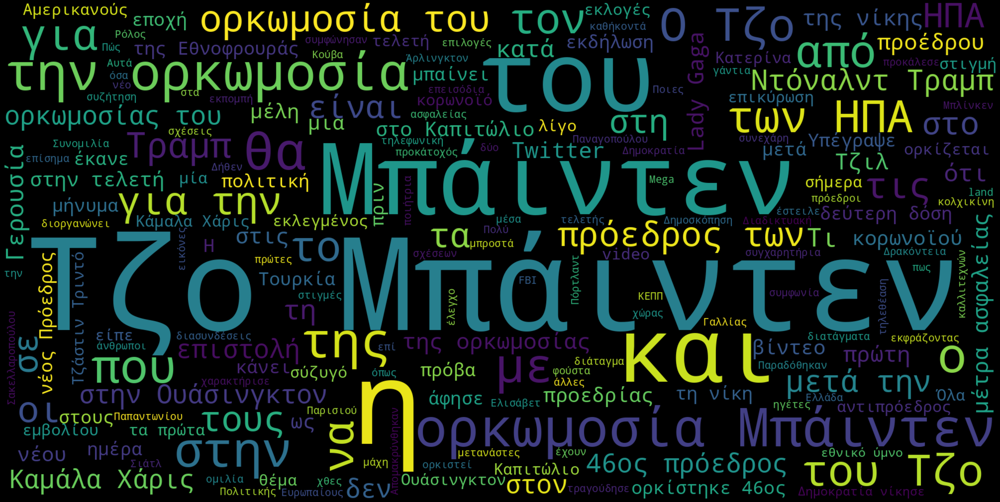

In [ ]:
wordcloud = WordCloud(  #ενώνει όλα τα κείμενα μαζί για να μας φέρει το wordcloud
    stopwords = STOPWORDS, # <- τα stopwords που θέλουμε να κοπούν
    width = 2000,
    height = 1000,
    background_color = 'black'
 ).generate(jan_text) # <- μέσα στην παρένθεση βάζουμε το όνομα της μεταβλητής του κειμένου
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [ ]:
list(STOPWORDS)[0:20] #ποιες λέξειςς δεν πρέπει να λαμβάνει υποψιν

['since',
 'themselves',
 'else',
 "aren't",
 "doesn't",
 'has',
 "we'll",
 'very',
 'here',
 'get',
 'our',
 'their',
 'few',
 'out',
 'such',
 'the',
 'that',
 "it's",
 'a',
 'under']

In [ ]:
import spacy

In [ ]:
# Κατέβασμα του μικρού πακέτου της ελληνικής γλώσσας, το οποίο είναι εκπαιδευμένο σε ειδησεογραφικά κείμενα.  #ΠΡΟΣΟΧΗ ΕΔΩ
!python -m spacy download el_core_news_sm

# Αν η παρακάτω εντολή δεν δουλεύει, κάνουμε Runtime ->  Restart Runtime, για να δει τις αλλαγές από το download...

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.6/12.6 MB 64.6 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('el_core_news_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
nlp = spacy.load('el_core_news_sm')

In [ ]:
print(sorted(nlp.Defaults.stop_words)[0:20]) # τα 20 πρώτα

['άλλα', 'άλλες', 'άλλη', 'άλλην', 'άλλης', 'άλλο', 'άλλοι', 'άλλον', 'άλλος', 'άλλοτε', 'άλλους', 'άλλων', 'άμα', 'άμεσα', 'άνευ', 'άνω', 'άξαφνα', 'άρα', 'άραγε', 'έγιναν']


In [ ]:
# function δημιουργίας wordcloud
def create_wordcloud(text):
  wordcloud = WordCloud(
      stopwords = nlp.Defaults.stop_words, # <- τα stopwords που θέλουμε να "κοπούν"
      width = 2000,
      height = 1000,
      background_color = 'black'
  ).generate(text) # <- μέσα στην παρένθεση βάζουμε το όνομα της μεταβλητής που έχουμε βάλει στα arguements που δέχεται το function
  return wordcloud

Φτιάχνω ξεχωριστό function για το wordcloud γιατί μπορεί να θέλω να δω κάτι στο wordcloud και όχι απαραίτητα να το κάνω εικόνα.

In [ ]:
wcloud = create_wordcloud(jan_text)
# το wcloud.words_ είναι ένα dictionary που τα keys είναι οι λέξεις και τα values οι συχνότητες
# βάζω τα items του dictionary σε λίστα για να μπορώ να δω μόνο ένα μέρος τους και όχι όλα
list(wcloud.words_.items())[:5]

[('Τζο Μπάιντεν', 1.0),
 ('Μπάιντεν', 0.5609756097560976),
 ('ΗΠΑ', 0.4634146341463415),
 ('ορκωμοσία Μπάιντεν', 0.4146341463414634),
 ('ορκωμοσία', 0.3170731707317073)]

In [ ]:
# function δημιουργίας της εικόνας του wordcloud  #ΓΙΑ ΔΗΜΙΟΥΡΓΙΑ ΕΙΚΟΝΑΣ
def create_wordcloud_img(text):
  wordcloud = create_wordcloud(text) # δημιουργία του wordcloud με το παραπάνω function
  # δημιουργία της εικόνας του wordcloud
  fig = plt.figure(
      figsize = (40, 30),
      facecolor = 'k',
      edgecolor = 'k')
  return plt.imshow(wordcloud)

Τώρα μπορώ να φτιάχνω wordclouds με μια μόνο εντολή (καλώντας το function που έφτιαξα και βάζοντας στην παρένθεση το όνομα της μεταβλητής του text που θέλω κάθε φορά)

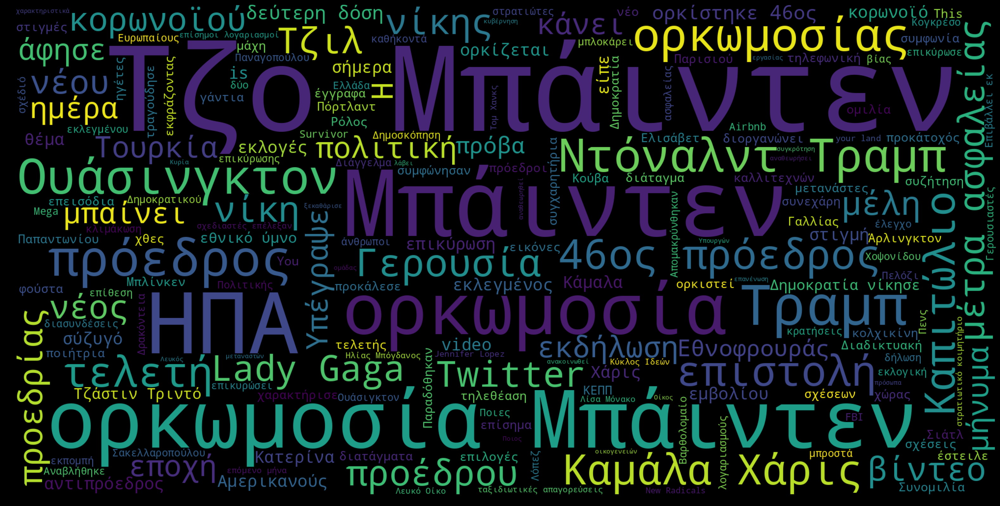

In [ ]:
create_wordcloud_img(jan_text)

In [ ]:
# # προσθήκη πολλών λέξεων στα stopwords (αν δεν υπάρχουν ήδη)
custom_stopwords = {'εκλογές',"Τζο" 'Κούβα', 'πολιτική',"Τραμπ","Ντόναλντ"}

for word in custom_stopwords:
   if word not in nlp.Defaults.stop_words:
     nlp.Defaults.stop_words.add(word)
     lex_attr = nlp.vocab[word]
     lex_attr.is_stop = True

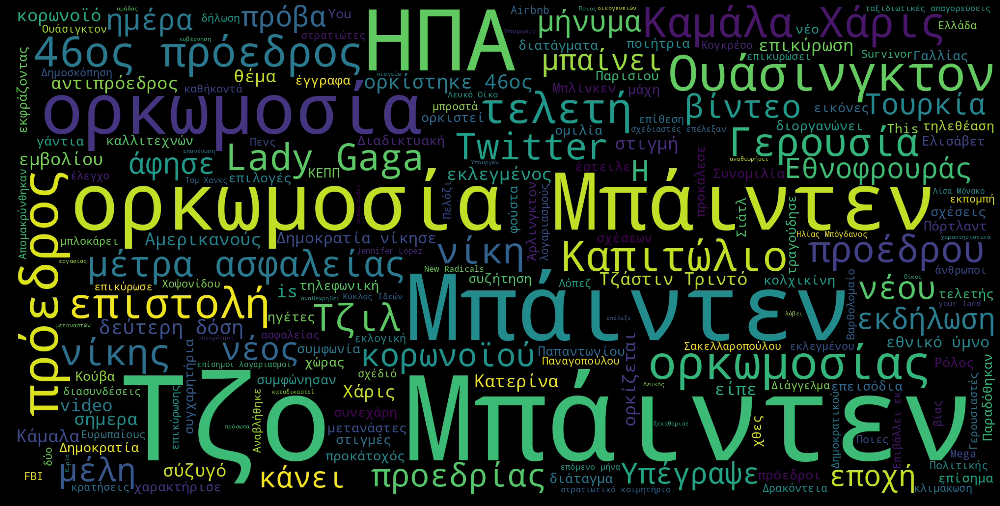

In [ ]:
create_wordcloud_img(jan_text)

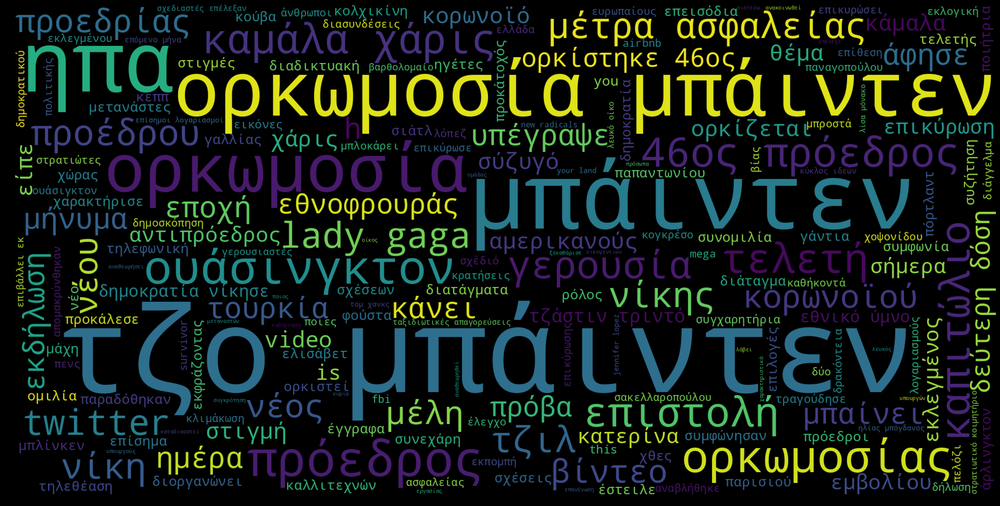

In [ ]:
jan_text_lower = jan_text.lower()
create_wordcloud_img(jan_text_lower)

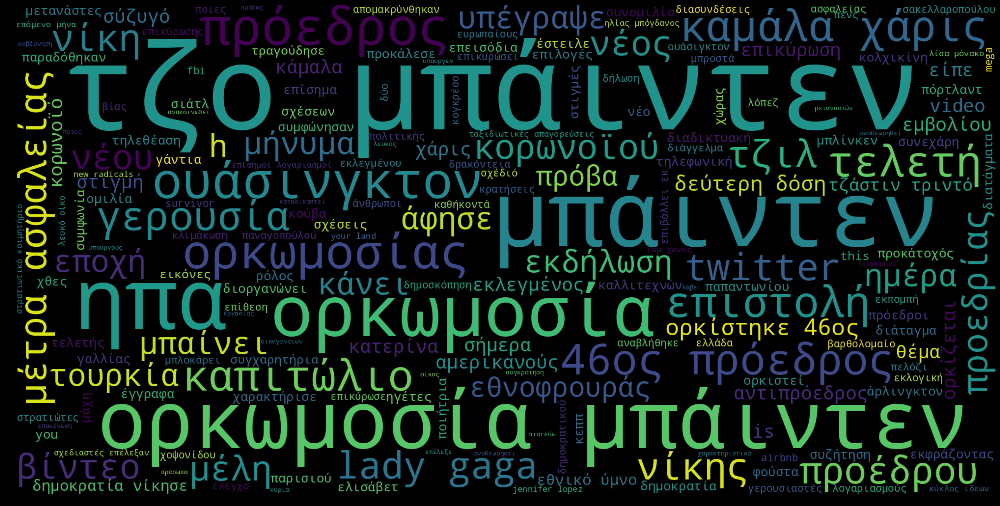

In [ ]:
jan_text_lower = jan_text_lower.replace("ορκομωσία", "ορκομωσίας")
create_wordcloud_img(jan_text_lower)

In [ ]:
# φτιάχνουμε ένα document (με tokens) περνώντας το jan_text_lower από το μοντέλο nlp
# tokens είναι μονάδες κειμένου που προκύπτουν όταν "σπάμε" ένα κείμενο σε μικρότερα κομμάτια — συνήθως λέξεις, σημεία στίξης ή αριθμοί
jan_doc = nlp(jan_text_lower)

# ας δούμε μερικά tokens και την αναγνώριση του μέρους του λόγου (part of speech: pos) που κάνει το γλωσικό μας μοντέλο
for token in jan_doc[:10]:
    print(f"{token.text} -> {token.lemma_} ({token.pos_})")

ρόλος -> ρόλος (NOUN)
της -> ο (DET)
τζιλ -> τζιλ (NOUN)
μπάιντεν -> μπάιντεν (ADJ)
στην -> σε ο (ADP)
επανένωση -> επανένωση (NOUN)
οικογενειών -> οικογενειών (NOUN)
μεταναστών -> μεταναστών (NOUN)
. -> . (PUNCT)
τζιλ -> τζιλ (ADV)


In [ ]:
# λημματοποιούμε όλο το κείμενο από τα άρθρα του Ιανουαρίου
tokenized_jan_doc = ' '.join(token.lemma_ for token in jan_doc)

In [ ]:
# ας δούμε ένα τμήμα του κειμένου μας
# πώς είναι κανονικά στα άρθρα
print(jan_text[:200])
# πώς το έκανε η λημματοποίηση
print(tokenized_jan_doc[:200])

Ρόλος της Τζιλ Μπάιντεν στην επανένωση οικογενειών μεταναστών. Τζιλ Μπάιντεν: Ποιος ο ρόλος που θα λάβει η Πρώτη Κυρία των ΗΠΑ - Την Τρίτη θα ανακοινωθεί η συγκρότηση της ομάδας εργασίας. Μπάιντεν: Θα
ρόλος ο τζιλ μπάιντεν σε ο επανένωση οικογενειών μεταναστών . τζιλ μπάιντεν : ποιος ο ρόλος που θα λαμβάνω ο πρώτος κυρία ο ΗΠΑ - ο τρίτος θα ανακοινωθεί ο συγκρότηση ο ομάδα εργασία . μπάιντεν : θα α


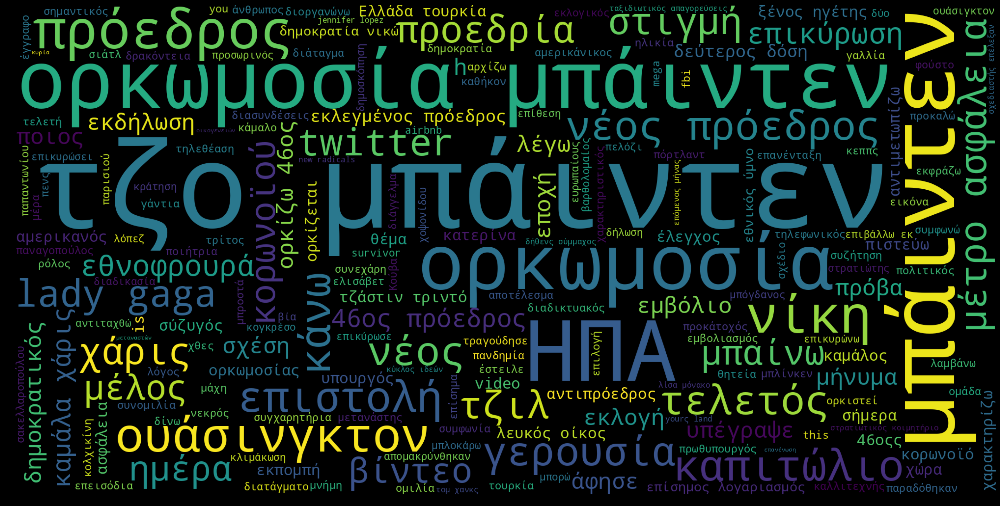

In [ ]:
create_wordcloud_img(tokenized_jan_doc)

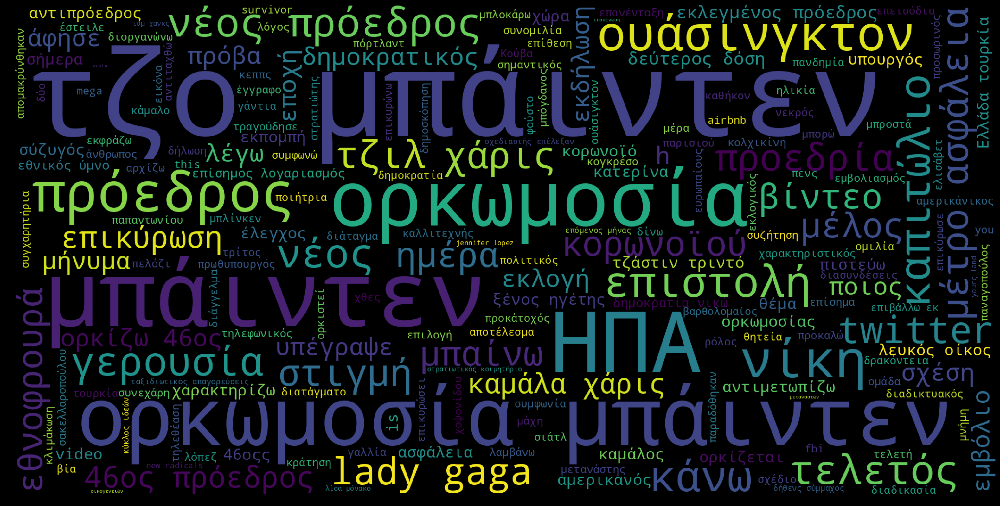

In [ ]:
# ας αφαιρέσουμε και το "τροχαίος" (που προέκυψε από τη λημματοποίηση της λέξης "τροχαία")
# προσθήκη λέξης στα stopwords
nlp.Defaults.stop_words.add("αμερικανικός")
create_wordcloud_img(tokenized_jan_doc)

Αν θέλουμε, μπορούμε να πάρουμε τις λέξεις και τις σχετικές συχνότητές τους σε dataframe.

In [ ]:
wordcloud = create_wordcloud(tokenized_jan_doc)
frequencies = wordcloud.words_
print(frequencies)

In [ ]:
wc_df = pd.DataFrame(frequencies.items(), columns=["λέξη", "σχετική συχνότητα"])
wc_df

,λέξη,σχετική συχνότητα
0,τζο μπάιντεν,1.000000
1,μπάιντεν,0.548780
2,ΗΠΑ,0.463415
3,ορκωμοσία μπάιντεν,0.426829
4,ορκωμοσία,0.390244
...,...,...
195,τομ χανκς,0.024390
196,επανένωση,0.012195
197,οικογενειών,0.012195
198,μεταναστών,0.012195


**Bonus Tip**:

Από τη στιγμή που έχουμε εφαρμόσει στο κείμενό μας το γλωσσικό μοντέλο (nlp), μπορούμε εύκολα να βρούμε Named Entities, να κάνουμε δηλαδή Named Entity Recognition (NER) με το spaCy.

In [ ]:
jan_doc.ents

(ηπα,
 τραμπ,
 τραμπ,
 ηπα,
 τραμπ,
 ντόναλντ τραμπ,
 ηπα,
 ηπα,
 ελλάδας,
 ηπα,
 τραμπ,
 ηπα,
 ηπα,
 τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 ηπα,
 twitter,
 twitter,
 twitter,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 this is,
 this is,
 america is,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 τραμπ,
 ηπα,
 ελλάδα,
 ελλάδα,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 ηπα,
 τραμπ,
 ηπα,
 ηπα,
 ντόναλντ τραμπ,
 fbi,
 fbi,
 τραμπ,
 τραμπ,
 ευρώπη,
 ηπα,
 twitter,
 twitter inc.,
 ηπα,
 ντόναλντ τραμπ,
 ηπα,
 ηπα,
 ηπα,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 ντόναλντ τραμπ,
 twitter,
 τραμπ,
 ηπα,
 ντόναλντ τραμπ,
 τραμπ,
 τραμπ,
 ηπα,
 ηπα,
 ηπα,
 ηπα,
 τραμπ,
 ηπα)

In [ ]:
for ent in jan_doc.ents:
  print(ent.text, ent.label_)